In [156]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report
%matplotlib inline

In [80]:
import warnings
warnings.filterwarnings("ignore")

In [81]:
train_df = pd.read_csv('train.csv',low_memory=False)

In [82]:
train_df.head()

,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,...,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
0,0x1602,CUS_0xd40,January,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,1824.843333,3,...,_,809.98,26.822620,22 Years and 1 Months,No,49.574949,80.41529543900253,High_spent_Small_value_payments,312.49408867943663,Good
1,0x1603,CUS_0xd40,February,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,NaN,3,...,Good,809.98,31.944960,NaN,No,49.574949,118.28022162236736,Low_spent_Large_value_payments,284.62916249607184,Good
2,0x1604,CUS_0xd40,March,Aaron Maashoh,-500,821-00-0265,Scientist,19114.12,NaN,3,...,Good,809.98,28.609352,22 Years and 3 Months,No,49.574949,81.699521264648,Low_spent_Medium_value_payments,331.2098628537912,Good
3,0x1605,CUS_0xd40,April,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,NaN,3,...,Good,809.98,31.377862,22 Years and 4 Months,No,49.574949,199.4580743910713,Low_spent_Small_value_payments,223.45130972736786,Good
4,0x1606,CUS_0xd40,May,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,1824.843333,3,...,Good,809.98,24.797347,22 Years and 5 Months,No,49.574949,41.420153086217326,High_spent_Medium_value_payments,341.48923103222177,Good


In [83]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 28 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   ID                        100000 non-null  object 
 1   Customer_ID               100000 non-null  object 
 2   Month                     100000 non-null  object 
 3   Name                      90015 non-null   object 
 4   Age                       100000 non-null  object 
 5   SSN                       100000 non-null  object 
 6   Occupation                100000 non-null  object 
 7   Annual_Income             100000 non-null  object 
 8   Monthly_Inhand_Salary     84998 non-null   float64
 9   Num_Bank_Accounts         100000 non-null  int64  
 10  Num_Credit_Card           100000 non-null  int64  
 11  Interest_Rate             100000 non-null  int64  
 12  Num_of_Loan               100000 non-null  object 
 13  Type_of_Loan              88592 non-null   ob

In [84]:
train_df.describe()

,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Delay_from_due_date,Num_Credit_Inquiries,Credit_Utilization_Ratio,Total_EMI_per_month
count,84998.000000,100000.000000,100000.00000,100000.000000,100000.000000,98035.000000,100000.000000,100000.000000
mean,4194.170850,17.091280,22.47443,72.466040,21.068780,27.754251,32.285173,1403.118217
std,3183.686167,117.404834,129.05741,466.422621,14.860104,193.177339,5.116875,8306.041270
min,303.645417,-1.000000,0.00000,1.000000,-5.000000,0.000000,20.000000,0.000000
25%,1625.568229,3.000000,4.00000,8.000000,10.000000,3.000000,28.052567,30.306660
50%,3093.745000,6.000000,5.00000,13.000000,18.000000,6.000000,32.305784,69.249473
75%,5957.448333,7.000000,7.00000,20.000000,28.000000,9.000000,36.496663,161.224249
max,15204.633333,1798.000000,1499.00000,5797.000000,67.000000,2597.000000,50.000000,82331.000000


In [85]:
#check for missing (in percentage)
(train_df.isnull().sum()/len(train_df))*100
#missing - Name,Monthly_salary,Type of loan,num of delayed payment,num of credit inquiries,credit hisory age,amonth invested monthly and monthly balance

ID                           0.000
Customer_ID                  0.000
Month                        0.000
Name                         9.985
Age                          0.000
SSN                          0.000
Occupation                   0.000
Annual_Income                0.000
Monthly_Inhand_Salary       15.002
Num_Bank_Accounts            0.000
Num_Credit_Card              0.000
Interest_Rate                0.000
Num_of_Loan                  0.000
Type_of_Loan                11.408
Delay_from_due_date          0.000
Num_of_Delayed_Payment       7.002
Changed_Credit_Limit         0.000
Num_Credit_Inquiries         1.965
Credit_Mix                   0.000
Outstanding_Debt             0.000
Credit_Utilization_Ratio     0.000
Credit_History_Age           9.030
Payment_of_Min_Amount        0.000
Total_EMI_per_month          0.000
Amount_invested_monthly      4.479
Payment_Behaviour            0.000
Monthly_Balance              1.200
Credit_Score                 0.000
dtype: float64

In [86]:
from ydata_profiling import ProfileReport
report = ProfileReport(train_df)
report

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [87]:
#droppping duplicate values 
train_df.drop_duplicates(inplace=True)

### EDA

### column by column approach

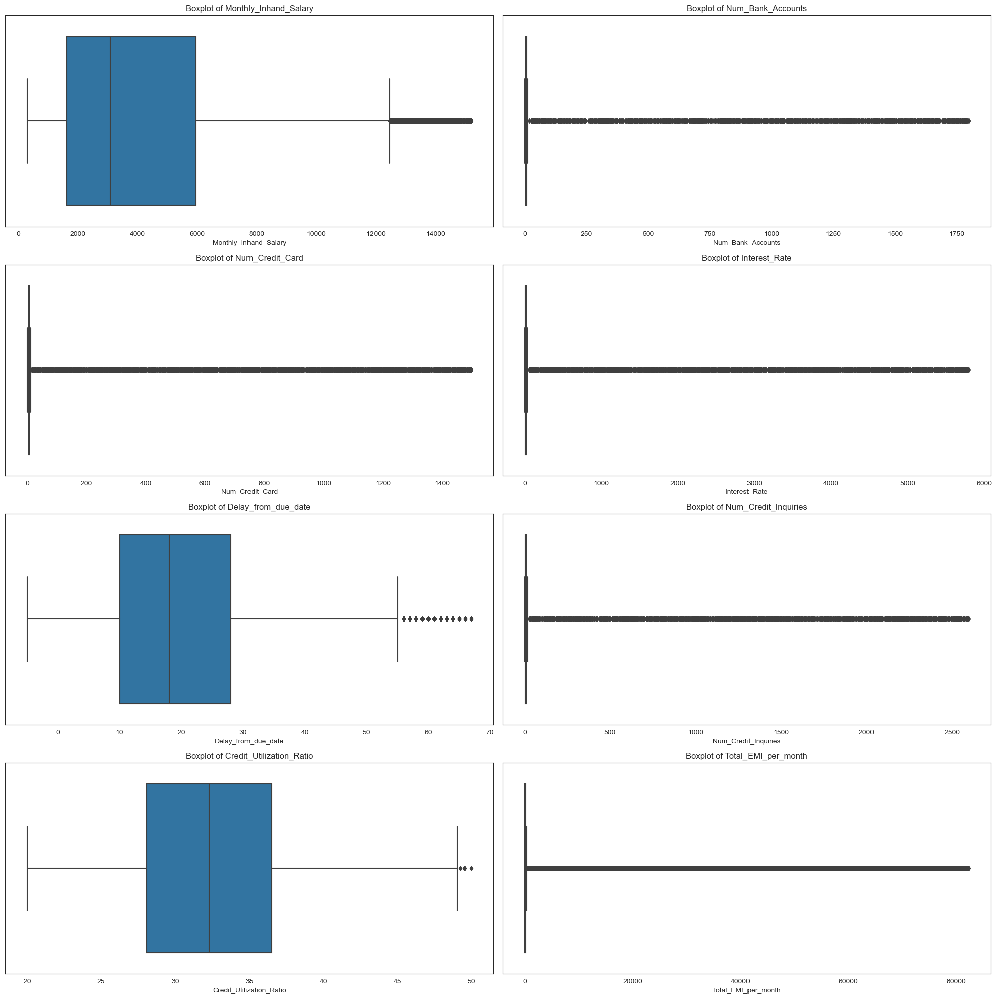

In [88]:
def plot_boxplots(df):
    cols = df.select_dtypes(include='number').columns
    num_plots = len(cols)
    num_rows = (num_plots+1)//2
    fig , axes = plt.subplots(nrows=num_rows,ncols=2,figsize=(20,20))
    for i,column in enumerate(cols):
        col = i %2
        row = i//2
        ax = axes[row,col]
        sns.boxplot(x=df[column],ax=ax)
        ax.set_title(f"Boxplot of {column}")
        ax.set_xlabel(column)
    plt.tight_layout()
    plt.show()
plot_boxplots(train_df)

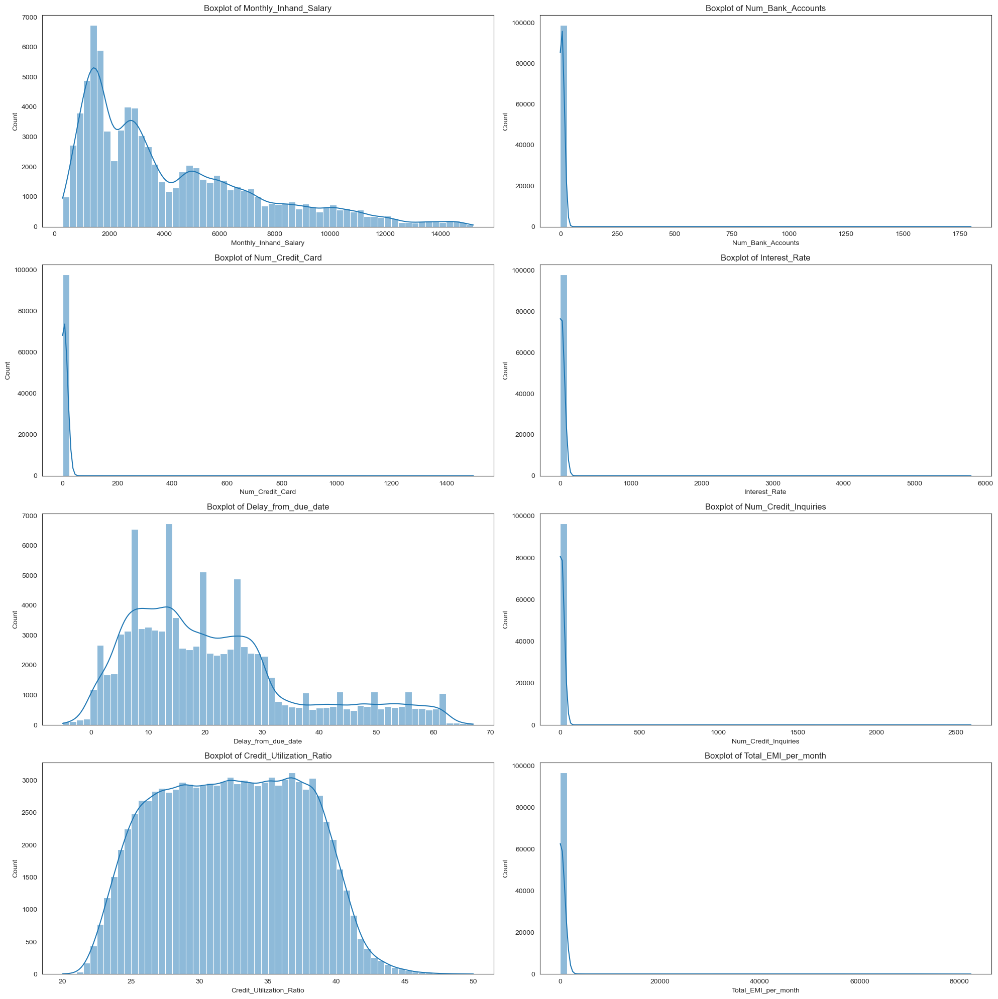

In [89]:
def plot_histplots(df):
    cols = df.select_dtypes(include='number').columns
    num_plots = len(cols)
    num_rows = (num_plots+1)//2
    fig , axes = plt.subplots(nrows=num_rows,ncols=2,figsize=(20,20))
    for i,column in enumerate(cols):
        col = i %2
        row = i//2
        ax = axes[row,col]
        sns.histplot(x=df[column],ax=ax,kde=True,bins=60)
        ax.set_title(f"Boxplot of {column}")
        ax.set_xlabel(column)
    plt.tight_layout()
    plt.show()
plot_histplots(train_df)

In [90]:
#month
train_df['Month'].value_counts()

Month
January     12500
February    12500
March       12500
April       12500
May         12500
June        12500
July        12500
August      12500
Name: count, dtype: int64

In [91]:
from sklearn.preprocessing import LabelEncoder
lbl_en = LabelEncoder()
train_df['Month'] = lbl_en.fit_transform(train_df['Month'])

In [92]:
train_df['Month'].head()

0    3
1    2
2    6
3    0
4    7
Name: Month, dtype: int64

In [93]:
#Name column - mapping a customer id to a name
cust_name = {}
for i,cust_id,name in train_df[['Customer_ID','Name']].itertuples():
    if cust_id not in cust_name:
        if not pd.isna(name):
            cust_name[cust_id] = name
            

In [94]:
#filling missing name using this dictionary
def fill_name(cols):
    cust_id = cols[0]
    name = cols[1]
    if pd.isna(name):
        return cust_name.get(cust_id, "No Name")  
    else:
        return name

In [95]:
train_df['Name'] = train_df[['Customer_ID','Name']].apply(fill_name,axis=1)

In [96]:
# name column is filled
train_df.isnull().sum()

ID                              0
Customer_ID                     0
Month                           0
Name                            0
Age                             0
SSN                             0
Occupation                      0
Annual_Income                   0
Monthly_Inhand_Salary       15002
Num_Bank_Accounts               0
Num_Credit_Card                 0
Interest_Rate                   0
Num_of_Loan                     0
Type_of_Loan                11408
Delay_from_due_date             0
Num_of_Delayed_Payment       7002
Changed_Credit_Limit            0
Num_Credit_Inquiries         1965
Credit_Mix                      0
Outstanding_Debt                0
Credit_Utilization_Ratio        0
Credit_History_Age           9030
Payment_of_Min_Amount           0
Total_EMI_per_month             0
Amount_invested_monthly      4479
Payment_Behaviour               0
Monthly_Balance              1200
Credit_Score                    0
dtype: int64

In [97]:
train_df['Name'] = lbl_en.fit_transform(train_df['Name'])

In [98]:
#Age column
# some elements contain _ at the end,  removing that using apply
train_df['Age'] = train_df['Age'].apply(lambda x : int(x[:-1]) if x[-1] == '_' else int(x))

In [99]:
# if age is more than 125 (maximum age) then set is to 125
train_df['Age'] = train_df['Age'].apply(lambda x : x if x <= 125 else 125)

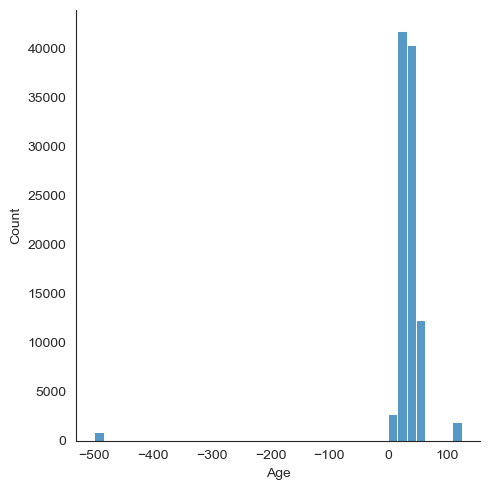

In [100]:
sns.set_style('white')
sns.displot(train_df['Age'],bins=40)

In [101]:
# SSN code consists of 9 digits first 3 digits is area code
#creating a area code column and dropping SSN
train_df['area_code'] = train_df['SSN'].apply(lambda x : x[:3])
                                              

In [102]:
train_df['area_code'] = lbl_en.fit_transform(train_df['area_code'])

In [103]:
train_df.drop('SSN',axis=1,inplace=True)

In [104]:
train_df['Occupation'].nunique()

16

In [105]:
train_df['Occupation'].value_counts()

Occupation
_______          7062
Lawyer           6575
Architect        6355
Engineer         6350
Scientist        6299
Mechanic         6291
Accountant       6271
Developer        6235
Media_Manager    6232
Teacher          6215
Entrepreneur     6174
Doctor           6087
Journalist       6085
Manager          5973
Musician         5911
Writer           5885
Name: count, dtype: int64

In [106]:
train_df['Occupation'] = lbl_en.fit_transform(train_df['Occupation'])

In [107]:
train_df.head()

,ID,Customer_ID,Month,Name,Age,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,...,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score,area_code
0,0x1602,CUS_0xd40,3,84,23,12,19114.12,1824.843333,3,4,...,809.98,26.822620,22 Years and 1 Months,No,49.574949,80.41529543900253,High_spent_Small_value_payments,312.49408867943663,Good,822
1,0x1603,CUS_0xd40,2,84,23,12,19114.12,NaN,3,4,...,809.98,31.944960,NaN,No,49.574949,118.28022162236736,Low_spent_Large_value_payments,284.62916249607184,Good,822
2,0x1604,CUS_0xd40,6,84,-500,12,19114.12,NaN,3,4,...,809.98,28.609352,22 Years and 3 Months,No,49.574949,81.699521264648,Low_spent_Medium_value_payments,331.2098628537912,Good,822
3,0x1605,CUS_0xd40,0,84,23,12,19114.12,NaN,3,4,...,809.98,31.377862,22 Years and 4 Months,No,49.574949,199.4580743910713,Low_spent_Small_value_payments,223.45130972736786,Good,822
4,0x1606,CUS_0xd40,7,84,23,12,19114.12,1824.843333,3,4,...,809.98,24.797347,22 Years and 5 Months,No,49.574949,41.420153086217326,High_spent_Medium_value_payments,341.48923103222177,Good,822


In [108]:
#the annual income is in text format - converting into numerical
#as some values contain _ at the end we remove it
train_df['Annual_Income'] = train_df['Annual_Income'].apply(lambda x : float(x[:-1]) if x[-1] == '_' else float(x))

In [109]:
train_df['Annual_Income'].dtype

dtype('float64')

In [110]:
train_df['Annual_Income'].describe()

count    1.000000e+05
mean     1.764157e+05
std      1.429618e+06
min      7.005930e+03
25%      1.945750e+04
50%      3.757861e+04
75%      7.279092e+04
max      2.419806e+07
Name: Annual_Income, dtype: float64

In [111]:
train_df['Monthly_Inhand_Salary'] = train_df.apply(lambda x: x['Annual_Income']/12 if pd.isna(x['Monthly_Inhand_Salary']) else x['Monthly_Inhand_Salary'], axis=1)

In [112]:
train_df.isnull().sum()

ID                              0
Customer_ID                     0
Month                           0
Name                            0
Age                             0
Occupation                      0
Annual_Income                   0
Monthly_Inhand_Salary           0
Num_Bank_Accounts               0
Num_Credit_Card                 0
Interest_Rate                   0
Num_of_Loan                     0
Type_of_Loan                11408
Delay_from_due_date             0
Num_of_Delayed_Payment       7002
Changed_Credit_Limit            0
Num_Credit_Inquiries         1965
Credit_Mix                      0
Outstanding_Debt                0
Credit_Utilization_Ratio        0
Credit_History_Age           9030
Payment_of_Min_Amount           0
Total_EMI_per_month             0
Amount_invested_monthly      4479
Payment_Behaviour               0
Monthly_Balance              1200
Credit_Score                    0
area_code                       0
dtype: int64

In [113]:
train_df['Num_Bank_Accounts'].sort_values(ascending=False).head(100)

20277    1798
64537    1798
29242    1794
69059    1794
35195    1793
         ... 
86875    1655
35174    1654
77215    1654
34624    1652
2904     1651
Name: Num_Bank_Accounts, Length: 100, dtype: int64

In [114]:
#cant have negative bank accounts
train_df['Num_Bank_Accounts'] = train_df['Num_Bank_Accounts'].apply(lambda x : 0 if x <0 else x)

In [115]:
train_df['Num_Bank_Accounts'].describe()

count    100000.000000
mean         17.091490
std         117.404803
min           0.000000
25%           3.000000
50%           6.000000
75%           7.000000
max        1798.000000
Name: Num_Bank_Accounts, dtype: float64

In [116]:
train_df['Interest_Rate'].sort_values(ascending=False).head(100)

71641    5797
73583    5789
23512    5788
88505    5776
77710    5775
         ... 
92437    5560
28645    5556
79982    5552
13573    5548
73951    5548
Name: Interest_Rate, Length: 100, dtype: int64

In [117]:
#num of loan is in text format converting it into int
train_df['Num_of_Loan'] = train_df['Num_of_Loan'].apply(lambda x : int(x[:-1]) if x[-1] == '_' else int(x))

In [118]:
#this column contains useful information and thus cant be dropped and not easy to fill column using other columns as there are many unique values
#thus filling the missing as unknown and encoding
train_df['Type_of_Loan'].fillna('Unknown',inplace=True)

In [119]:
train_df['Type_of_Loan'].value_counts()

Type_of_Loan
Unknown                                                                                                                               11408
Not Specified                                                                                                                          1408
Credit-Builder Loan                                                                                                                    1280
Personal Loan                                                                                                                          1272
Debt Consolidation Loan                                                                                                                1264
                                                                                                                                      ...  
Not Specified, Mortgage Loan, Auto Loan, and Payday Loan                                                                                  8
Payday 

In [120]:
train_df['Type_of_Loan'] = lbl_en.fit_transform(train_df['Type_of_Loan'])

In [121]:
train_df.isnull().sum()

ID                             0
Customer_ID                    0
Month                          0
Name                           0
Age                            0
Occupation                     0
Annual_Income                  0
Monthly_Inhand_Salary          0
Num_Bank_Accounts              0
Num_Credit_Card                0
Interest_Rate                  0
Num_of_Loan                    0
Type_of_Loan                   0
Delay_from_due_date            0
Num_of_Delayed_Payment      7002
Changed_Credit_Limit           0
Num_Credit_Inquiries        1965
Credit_Mix                     0
Outstanding_Debt               0
Credit_Utilization_Ratio       0
Credit_History_Age          9030
Payment_of_Min_Amount          0
Total_EMI_per_month            0
Amount_invested_monthly     4479
Payment_Behaviour              0
Monthly_Balance             1200
Credit_Score                   0
area_code                      0
dtype: int64

In [122]:
#delayed payments
delay_count_df = pd.DataFrame(train_df.groupby('Name')['Num_of_Delayed_Payment'].count())

In [123]:
def delay_count_fun(cols):
    num_delay = cols[0]
    name = int(cols[1])
    if pd.isna(num_delay) == False:
        if num_delay[-1] == '_':
            return int(num_delay[:-1])
        else:
            return int(num_delay)
    else:
        return int(delay_count_df['Num_of_Delayed_Payment'][name])          

In [124]:
train_df['Num_of_Delayed_Payment'] = train_df[['Num_of_Delayed_Payment','Name']].apply(delay_count_fun,axis=1)

In [125]:
train_df['Changed_Credit_Limit'] = train_df['Changed_Credit_Limit'].apply(lambda x : 0.00 if x == '_' else float(x))

In [126]:
train_df.isnull().sum()

ID                             0
Customer_ID                    0
Month                          0
Name                           0
Age                            0
Occupation                     0
Annual_Income                  0
Monthly_Inhand_Salary          0
Num_Bank_Accounts              0
Num_Credit_Card                0
Interest_Rate                  0
Num_of_Loan                    0
Type_of_Loan                   0
Delay_from_due_date            0
Num_of_Delayed_Payment         0
Changed_Credit_Limit           0
Num_Credit_Inquiries        1965
Credit_Mix                     0
Outstanding_Debt               0
Credit_Utilization_Ratio       0
Credit_History_Age          9030
Payment_of_Min_Amount          0
Total_EMI_per_month            0
Amount_invested_monthly     4479
Payment_Behaviour              0
Monthly_Balance             1200
Credit_Score                   0
area_code                      0
dtype: int64

In [127]:
#filling num_inquiries by 0 as its most common
train_df['Num_Credit_Inquiries'].fillna(0,inplace=True)

In [128]:
train_df['Credit_Mix'].value_counts()

Credit_Mix
Standard    36479
Good        24337
_           20195
Bad         18989
Name: count, dtype: int64

<Axes: xlabel='Credit_Mix', ylabel='count'>

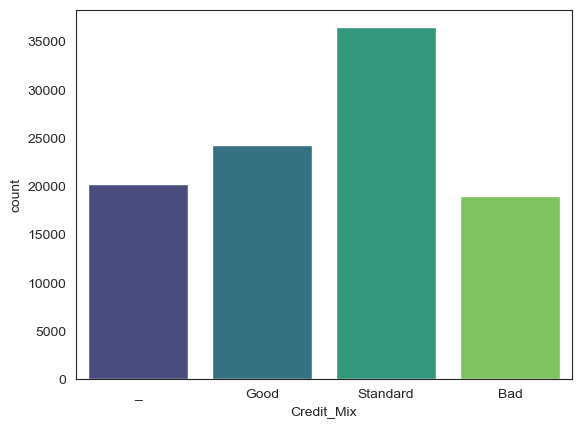

In [129]:
sns.countplot(x='Credit_Mix',data=train_df,palette='viridis')

In [130]:
train_df['Credit_Mix'] = lbl_en.fit_transform(train_df['Credit_Mix'])

In [131]:
#outstanding debt column
train_df['Outstanding_Debt'] = train_df['Outstanding_Debt'].apply(lambda x :float(x[:-1]) if x[-1]=='_' else float(x))

In [132]:
history_map = {}
for i,name,credit in train_df[['Name','Credit_History_Age']].itertuples():
    if name not in history_map:
        if pd.isna(credit) == False:
            history_map[name] = credit

In [133]:
history_map

{84: '22 Years and 1 Months',
 7491: '26 Years and 7 Months',
 4940: '17 Years and 9 Months',
 3840: '17 Years and 3 Months',
 2111: '30 Years and 8 Months',
 6672: '32 Years and 0 Months',
 6347: '30 Years and 7 Months',
 711: '14 Years and 8 Months',
 1489: '21 Years and 4 Months',
 3739: '26 Years and 6 Months',
 7913: '19 Years and 2 Months',
 8479: '25 Years and 5 Months',
 3340: '26 Years and 10 Months',
 8308: '8 Years and 11 Months',
 7196: '18 Years and 2 Months',
 1456: '16 Years and 10 Months',
 6867: '29 Years and 2 Months',
 6906: '6 Years and 5 Months',
 5034: '27 Years and 2 Months',
 7378: '18 Years and 2 Months',
 5766: '19 Years and 3 Months',
 5130: '10 Years and 1 Months',
 6512: '32 Years and 9 Months',
 5974: '12 Years and 3 Months',
 7514: '12 Years and 3 Months',
 7401: '17 Years and 10 Months',
 827: '13 Years and 8 Months',
 9563: '19 Years and 2 Months',
 2190: '30 Years and 3 Months',
 7975: '8 Years and 9 Months',
 6278: '18 Years and 3 Months',
 885: '18 Y

In [134]:
train_df['Credit_History_Age'] = train_df[['Credit_History_Age','Name']].apply(lambda x : history_map[x[1]] if pd.isna(x[0]) else x[0],axis=1)

In [135]:
#calculating total months
# 12 into year which will be x.split()[0] + months which will be x.split()[3]
train_df['Credit_History_Age'] = train_df['Credit_History_Age'].apply(lambda x : 12*int(x.split()[0])+int(x.split()[3]))

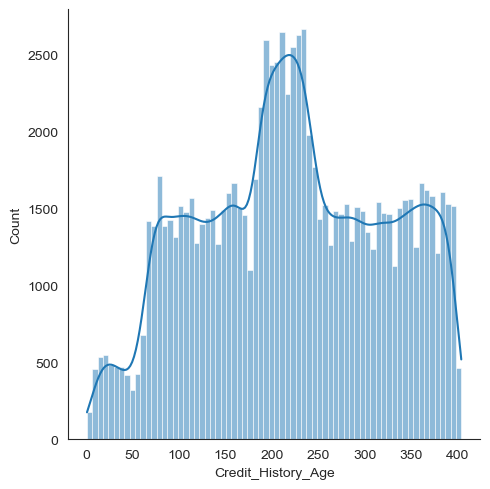

In [136]:
sns.displot(train_df['Credit_History_Age'],bins=70,kde=True)

<Axes: xlabel='Payment_of_Min_Amount', ylabel='count'>

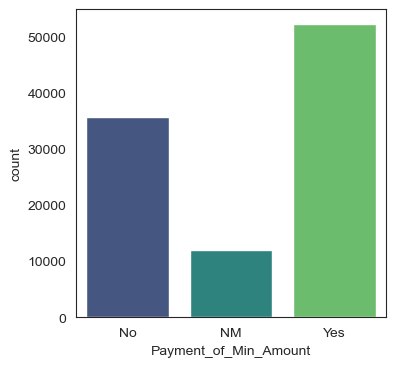

In [137]:
plt.figure(figsize=(4,4))
sns.countplot(x = 'Payment_of_Min_Amount',data=train_df,palette='viridis')

In [138]:
train_df['Payment_of_Min_Amount'] = lbl_en.fit_transform(train_df['Payment_of_Min_Amount'])

In [139]:
#montly amount average for each name
name_amnt = train_df.groupby('Name')['Amount_invested_monthly'].describe()['top']

In [140]:
train_df['Amount_invested_monthly'] = train_df[['Name','Amount_invested_monthly']].apply(lambda x : name_amnt[x[0]] if pd.isna(x[1]) else x[1] ,axis=1)

In [141]:
train_df['Amount_invested_monthly'] = train_df['Amount_invested_monthly'].apply(lambda x : 10000.00 if x =='__10000__' else float(x))

In [142]:
train_df['Payment_Behaviour'] = lbl_en.fit_transform(train_df['Payment_Behaviour'])

In [143]:
train_df.isnull().sum()

ID                             0
Customer_ID                    0
Month                          0
Name                           0
Age                            0
Occupation                     0
Annual_Income                  0
Monthly_Inhand_Salary          0
Num_Bank_Accounts              0
Num_Credit_Card                0
Interest_Rate                  0
Num_of_Loan                    0
Type_of_Loan                   0
Delay_from_due_date            0
Num_of_Delayed_Payment         0
Changed_Credit_Limit           0
Num_Credit_Inquiries           0
Credit_Mix                     0
Outstanding_Debt               0
Credit_Utilization_Ratio       0
Credit_History_Age             0
Payment_of_Min_Amount          0
Total_EMI_per_month            0
Amount_invested_monthly        0
Payment_Behaviour              0
Monthly_Balance             1200
Credit_Score                   0
area_code                      0
dtype: int64

In [144]:
#same approach for name
name_bal = train_df.groupby('Name')['Monthly_Balance'].describe()['top']

In [145]:
train_df['Monthly_Balance'] = train_df[['Name','Monthly_Balance']].apply(lambda x : name_bal[x[0]] if pd.isna(x[1]) else x[1] ,axis=1)

In [146]:
train_df['Monthly_Balance'] = train_df['Monthly_Balance'].apply(lambda x : -333333333333333333333333333.33 if x=='__-333333333333333333333333333__' else float(x))

In [147]:
# target variable 
train_df['Credit_Score'] = lbl_en.fit_transform(train_df['Credit_Score'])

<Axes: >

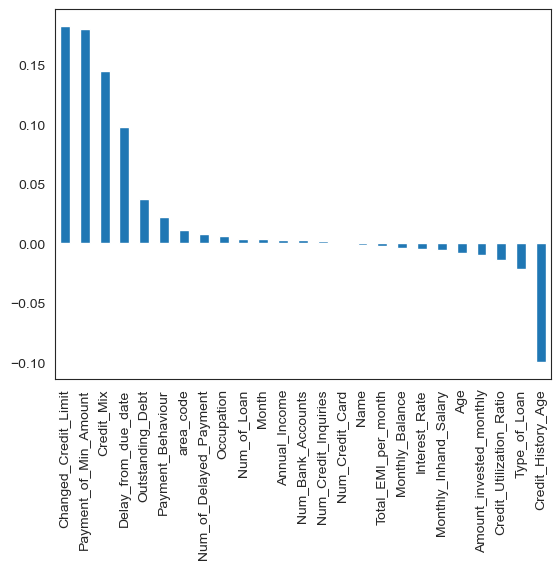

In [148]:
train_df.select_dtypes(include='number').corr()['Credit_Score'].sort_values(ascending=False).drop('Credit_Score').plot(kind='bar')

In [149]:
#no high correlation with target column 
train_df.isnull().sum()

ID                          0
Customer_ID                 0
Month                       0
Name                        0
Age                         0
Occupation                  0
Annual_Income               0
Monthly_Inhand_Salary       0
Num_Bank_Accounts           0
Num_Credit_Card             0
Interest_Rate               0
Num_of_Loan                 0
Type_of_Loan                0
Delay_from_due_date         0
Num_of_Delayed_Payment      0
Changed_Credit_Limit        0
Num_Credit_Inquiries        0
Credit_Mix                  0
Outstanding_Debt            0
Credit_Utilization_Ratio    0
Credit_History_Age          0
Payment_of_Min_Amount       0
Total_EMI_per_month         0
Amount_invested_monthly     0
Payment_Behaviour           0
Monthly_Balance             0
Credit_Score                0
area_code                   0
dtype: int64

In [150]:
#dropping ID and CustomerID
train_df.drop(['ID','Customer_ID'],axis=1,inplace=True)

In [151]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 26 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   Month                     100000 non-null  int64  
 1   Name                      100000 non-null  int64  
 2   Age                       100000 non-null  int64  
 3   Occupation                100000 non-null  int64  
 4   Annual_Income             100000 non-null  float64
 5   Monthly_Inhand_Salary     100000 non-null  float64
 6   Num_Bank_Accounts         100000 non-null  int64  
 7   Num_Credit_Card           100000 non-null  int64  
 8   Interest_Rate             100000 non-null  int64  
 9   Num_of_Loan               100000 non-null  int64  
 10  Type_of_Loan              100000 non-null  int64  
 11  Delay_from_due_date       100000 non-null  int64  
 12  Num_of_Delayed_Payment    100000 non-null  int64  
 13  Changed_Credit_Limit      100000 non-null  fl

<Axes: >

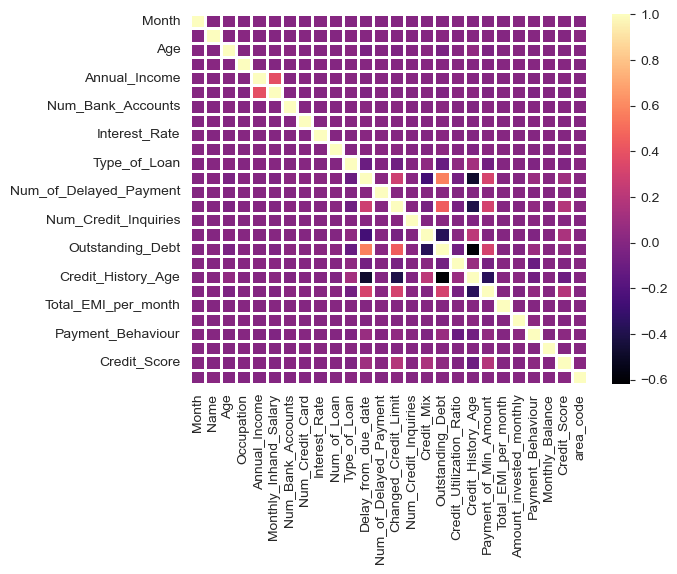

In [152]:
#heatmap
sns.heatmap(train_df.corr(),cmap='magma',linecolor='white',linewidths=1)

### Data cleaning and EDA complete

In [153]:
#splitting data
X = train_df.drop('Credit_Score',axis=1)
y = train_df['Credit_Score']

In [154]:
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.3,random_state=42)
X_train,X_val,y_train,y_val = train_test_split(X_train,y_train,test_size=0.2,random_state=42)

In [160]:
params_xgb = {
    "tree_method": "auto",
    "n_estimators": 2500,
    "learning_rate": 0.025,
    "max_depth": 13,
    "min_child_weight": 1,
    "subsample": 1.0,
    "colsample_bytree": 1.0,
    "gamma": 2,
    "reg_lambda": 1,
    "objective": "binary:logistic",
    "eval_metric": "logloss",
    "random_state": 0,
}
cats = X.select_dtypes(exclude=np.number).columns.tolist()

for col in cats:
    X[col] = X[col].astype("category")
import xgboost as xgb
from xgboost import XGBClassifier
xg_cl = XGBClassifier(**params_xgb, enable_categorical=True)
xg_cl.fit(X_train, y_train)
pred_xgb = xg_cl.predict(X_test)
print(classification_report(y_test,pred_xgb))

              precision    recall  f1-score   support

           0       0.68      0.71      0.69      5322
           1       0.77      0.75      0.76      8805
           2       0.78      0.79      0.79     15873

    accuracy                           0.76     30000
   macro avg       0.74      0.75      0.75     30000
weighted avg       0.76      0.76      0.76     30000



In [167]:
params = {
    'learning_rate': 0.01,
    'boosting_type': 'gbdt',
    'objective': 'multiclass',      # Changed objective to regression
    'metric': 'multi_logloss',               # Changed metric to rmse (Root Mean Squared Error)
    'sub_feature': 0.8,       # Set colsample_bytree directly
    'num_leaves': 45,
    'min_child_samples': 25,        # Changed min_child_samples to min_data
    'n_estimators': 250,
    'max_depth': 50,
    'num_classes':3
}

In [ ]:
from lightgbm import LGBMRegressor
lgbm = LGBMRegressor(**params)
lgbm.fit(X_train,y_train,eval_set=(X_val,y_val))

[LightGBM] [Warning] feature_fraction is set with colsample_bytree=1.0, will be overridden by sub_feature=0.8. Current value: feature_fraction=0.8
[LightGBM] [Warning] feature_fraction is set with colsample_bytree=1.0, will be overridden by sub_feature=0.8. Current value: feature_fraction=0.8
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002643 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4569
[LightGBM] [Info] Number of data points in the train set: 56000, number of used features: 25
[LightGBM] [Warning] feature_fraction is set with colsample_bytree=1.0, will be overridden by sub_feature=0.8. Current value: feature_fraction=0.8
[LightGBM] [Info] Start training from score -1.719472
[LightGBM] [Info] Start training from score -1.244857
[LightGBM] [Info] Start training from score -0.629502


In [163]:
pred_lgbm = lgbm.predict(X_test)
print(classification_report(y_test,pred_lgbm))

[LightGBM] [Warning] feature_fraction is set with colsample_bytree=1.0, will be overridden by sub_feature=0.8. Current value: feature_fraction=0.8


ValueError: Classification metrics can't handle a mix of multiclass and continuous targets